## PRAW

`praw`, or the [Python Reddit API Wrapper](https://praw.readthedocs.io/en/latest/index.html), is our best tool for interfacing with Reddit content.

### Getting Set up

Installing `praw` is as easy as `pip install praw`.

However, it doesn't work out of the box. Before we can get rolling, we need to set up the proper credentials to use the underlying API.

Assuming you've got an existing Reddit account, you can go to https://www.reddit.com/prefs/apps/ and create a new "application."

Once you're through the boilerplate of filling everything out, click Edit on your app to get at the appropriate tokens you'll need to use PRAW (in red below)

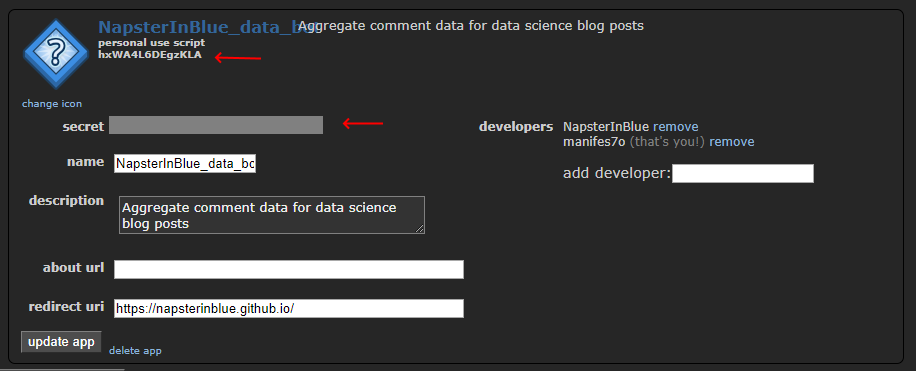

In [1]:
from IPython.display import Image
Image('images/praw_info.PNG')

Then, using the values for `client_id` and `client_secret`, respectively, you can kick off your own Reddit instance via

``` python
import praw

reddit = praw.Reddit(client_id='my_client_id',
                     client_secret='my_client_secret',
                     user_agent='my_user_agent')

print(reddit.read_only) #prints: True
```

**Here I'm omitting a cell where I actually ran my info. Needed a real session to do the rest of the tutorial.**

In [2]:
import praw

reddit = praw.Reddit(client_id='hxWA4L6DEgzKLA',
                     client_secret='gBe5AJj7v1lfTNXYmbBa7KdAFRU',
                     user_agent='napster in blue script')

In [3]:
reddit.read_only

True

### Getting a bunch of posts

Say you you wanted to stay abreast of your favorite [Lovecraft-Jim Davis hybrid fansite](https://www.reddit.com/r/imsorryjon/) via some scripting/botting.

First you'd simply use the `subreddit()` method of your Reddit Session instance

In [4]:
sorry_jon = reddit.subreddit('imsorryjon')
sorry_jon

Subreddit(display_name='imsorryjon')

Then, like landing on the subreddit page, you can organize the posts by some ordering scheme

In [5]:
hot_listings = sorry_jon.hot(limit=10)

In [6]:
top_listings = sorry_jon.top(limit=10, time_filter='week')

This is going to return a `Generator` subclass that spits out each post you'd see if you looked at the page.

We can't access them with regular `top_listings[0]`, `list`-like indexes, but instead via the `next()` method, or some sort of loop.

In [7]:
top_listings.next()

Submission(id='ca8jl5')

[See my notes on iterators and Python 3 if this is unclear](https://napsterinblue.github.io/blog/2018/05/01/why-i-switched-to-python-3/#Iterators), otherwise, we'll move on to...

### Submission Objects

[I saved this post](https://www.reddit.com/r/funny/comments/g3d5r/whats_green_and_pecks_on_a_tree/) on Reddit 8 years ago and it still gets a good laugh out of me.

The URL reads `https://www.reddit.com/r/funny/comments/g3d5r/whats_green_and_pecks_on_a_tree/`.

If we want to access this thread via `praw`, we'll leverage the string right after `/comments/` via `reddit.submission()`

In [8]:
submission = reddit.submission('g3d5r')

This returns a `Submission` object

In [9]:
type(submission)

praw.models.reddit.submission.Submission

That, among other things lets us see:

In [10]:
title = submission.title
print(title)

What's green and pecks on a tree?


In [11]:
body = submission.selftext
print(body)

Woody Wood-Pickle. I just read that on a Laffy Taffy wrapper. That is the worst goddamned joke I have ever heard. I'm so angry right now.  


EDIT: I had no idea this would get frontpaged. I posted this in a combination of disbelief and anger. Thank you all for posting your awful Laffy Taffy jokes. I had no idea they were so universally considered awful! 


In [12]:
author = submission.author
print(author)

Javier_Disco


In [13]:
subreddit = submission.subreddit
print(subreddit)

funny


In [14]:
upvotes = submission.score
print(upvotes)

1537


In [15]:
comments = submission.comments
print(comments)

At first glance, a bit uninviting.

### Navigating Comments

Before we dive into the comments of this submission, we're going to ensure that our comments are sorted in order of score

**Note**: I had to re-instantiate `submission` for the sort to work. Huh.

In [16]:
submission = reddit.submission('g3d5r')
submission.comment_sort = 'top'
comments = submission.comments

We might intuitively reach for [the first comment](https://www.reddit.com/r/funny/comments/g3d5r/whats_green_and_pecks_on_a_tree/c1kmgfc/) like we would with a `list`, but this yields a `Comment` object.

In [17]:
top_comment = comments[0]

However, this is actually more powerful, because it gives us access to additional metadata, just like the `Submission` object

In [18]:
top_comment.body

'Mathew W from Tenton NJ is a piece of shit. '

In [19]:
top_comment.author

Redditor(name='Javier_Disco')

In [20]:
top_comment.gilded

0

An important thing to note is that `praw`'s `CommentForest` object is actually a hierarchical data structure. Thus, taking the first five values of `comments`, as below, doesn't give us the first 5 comments that you read when you visit the post, but instead, *the first 5 root-level comments*, ordered by upvote count, descending

In [21]:
for _, comment in zip(range(5), comments):
    print(comment.body, '\n', '-'*5)

Mathew W from Tenton NJ is a piece of shit.  
 -----
I still remember one I read off my wrapper from a few years back: 
Q: Why did the farmer have sheep?
A: Because he was a sheep farmer.  
 -----
pickles come in pecks 
 -----
The worst one I ever saw was "Frankenstein used to play baseball and he was really mean too.  Do you know how mean he once was?"
"He stole all the bases."

WHY FRANKENSTEIN? 
 -----
One of the few things I want to do in life is to get really drunk, buy a bag of Laffy Taffys, and go to an open mic night and just eat the bag of Laffy Taffys and read the jokes.

At the end of my set, I vomit rainbow colored taffy all over the stage. 
 -----


If we wanted to read more about the author's opinion of a one "Matthew W from Tenton NJ", we'd have to interrogate the first root-level comment for the replies.

This, in turn, gives us a flat look at all of *those* next highest-level comments

In [22]:
for _, comment in zip(range(2), top_comment.replies):
    print(comment.body, '\n', '-'*5)

*Trenton
 
 -----
[Just for you OP](http://www.commonplacebook.com/jokes/funny_lists/laffy_taffyhtml.shtm). The worst laffy taffy jokes ever. After reading this list you just may go out and kill someone. 


 
 -----


To keep pulling on that thread, we need to be clever about our traversal scheme. Here, we'll keep taking the next-highest-voted comment at each level for 5 steps.

In [23]:
curr_comment = comments[0]

for _ in range(5):
    print(curr_comment.author, ': ')
    print('  ', curr_comment.body, '\n')
    
    curr_comment = curr_comment.replies[0]

Javier_Disco : 
   Mathew W from Tenton NJ is a piece of shit.  

ENTP : 
   *Trenton
 

Javier_Disco : 
   Yeah, that.  

ENTP : 
   *Matthew W. 

Javier_Disco : 
   I'll spell his name right when he stops making bullshit jokes.  



### Getting Images

Finally, if we want to see the images that make up the subreddits, we just need to inspect the `url` that the post itself points to.

In [24]:
most_garfield = sorry_jon.top('all').next()
most_garfield

Submission(id='bvkbuv')

In [25]:
url = most_garfield.url
url

'https://i.redd.it/6htqm78noq131.jpg'

Then we can just follow [this tutorial](https://napsterinblue.github.io/notes/python/images/img_from_url/) on getting images via `requests`

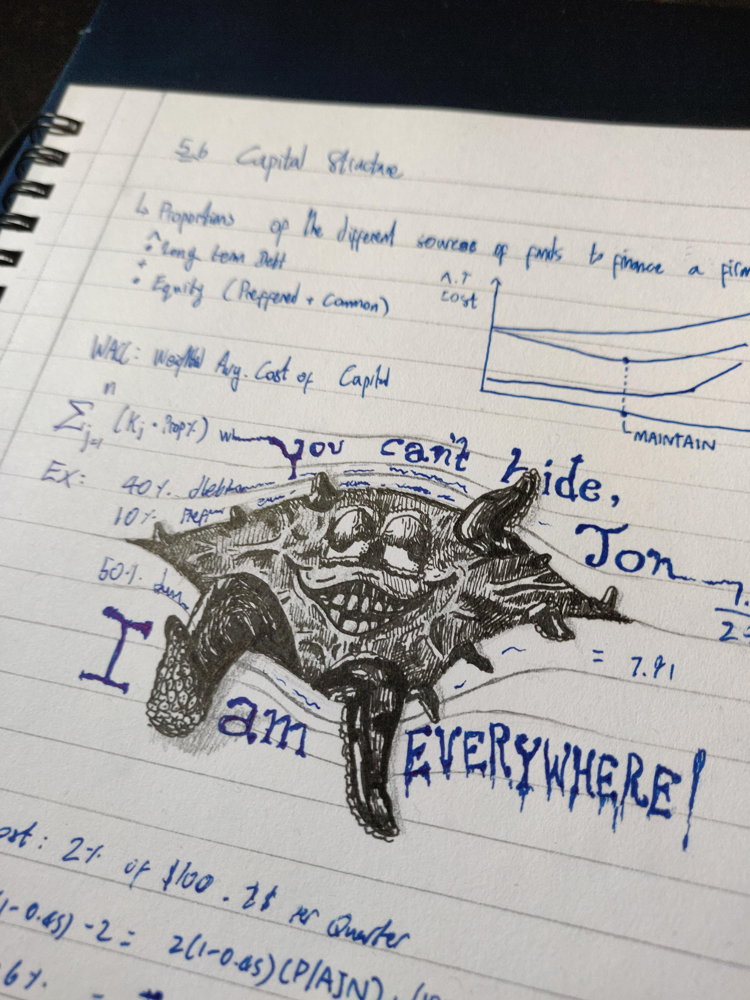

In [26]:
from PIL import Image
import requests
from io import BytesIO

response = requests.get(url)
img = Image.open(BytesIO(response.content))
img